# 22.6) Base do Cartão de Crédito -> Mais atributos



antes era feito o agrupamento pelo limite do cartão de crédito com os gastos somados; 

agora será com mais registros. 
 

### Additional Information

This research aimed at the case of customers' default payments in Taiwan and compares the predictive accuracy of probability of default among six data mining methods. From the perspective of risk management, the result of predictive accuracy of the estimated probability of default will be more valuable than the binary result of classification - credible or not credible clients. Because the real probability of default is unknown, this study presented the novel Sorting Smoothing Method to estimate the real probability of default. With the real probability of default as the response variable (Y), and the predictive probability of default as the independent variable (X), the simple linear regression result (Y = A + BX) shows that the forecasting model produced by artificial neural network has the highest coefficient of determination; its regression intercept (A) is close to zero, and regression coefficient (B) to one. Therefore, among the six data mining techniques, artificial neural network is the only one that can accurately estimate the real probability of default.

### Additional Variable Information

This research employed a binary variable, default payment (Yes = 1, No = 0), as the response variable. This study reviewed the literature and used the following 23 variables as explanatory variables:

X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.

X2: Gender (1 = male; 2 = female).

X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).

X4: Marital status (1 = married; 2 = single; 3 = others).

X5: Age (year).

X6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;X11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.

X12-X17: Amount of bill statement (NT dollar). X12 = amount of bill statement in September, 2005; X13 = amount of bill statement in August, 2005; . . .; X17 = amount of bill statement in April, 2005. 

X18-X23: Amount of previous payment (NT dollar). X18 = amount paid in September, 2005; X19 = amount paid in August, 2005; . . .;X23 = amount paid in April, 2005.

In [1]:
import pandas as pd
base_cartao = pd.read_csv('credit_card_clients.csv', header = 1)
base_cartao.tail(10)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
29990,29991,140000,1,2,1,41,0,0,0,0,...,138262,49675,46121,6000,7000,4228,1505,2000,2000,0
29991,29992,210000,1,2,1,34,3,2,2,2,...,2500,2500,2500,0,0,0,0,0,0,1
29992,29993,10000,1,3,1,43,0,0,0,-2,...,0,0,0,2000,0,0,0,0,0,0
29993,29994,100000,1,1,2,38,0,-1,-1,0,...,70626,69473,55004,2000,111784,4000,3000,2000,2000,0
29994,29995,80000,1,2,2,34,2,2,2,2,...,77519,82607,81158,7000,3500,0,7000,0,4000,1
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1
29999,30000,50000,1,2,1,46,0,0,0,0,...,36535,32428,15313,2078,1800,1430,1000,1000,1000,1


In [2]:
base_cartao.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

In [3]:


# LIMIT_BAL limite do cartão de crédito dos clientes 

# 'PAY_0','PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6' pagamentos anteriores do cartão de crédito 


# 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',total da fatura do cartão de crédito nos seis meses

# 'PAY_AMT1',  'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6' o quanto o cliente pagou a fatura
# para ver se pagou certinho tem que subitrair o BILL_AMT do PAY_AMT

# que indica se o cliente vai ou não pagar a próxima fatura    'default payment next month'

#1  o cliente não pagou

# 0  o cliente pagou



para ver se o cliente pagará ou não o banco, com base na classificação. 

In [4]:
base_cartao['BILL_TOTAL'] = base_cartao['BILL_AMT1'] + base_cartao['BILL_AMT2'] + base_cartao['BILL_AMT3'] + base_cartao['BILL_AMT4'] + base_cartao['BILL_AMT5'] + base_cartao['BILL_AMT6']

In [5]:
base_cartao.tail()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL
29995,29996,220000,1,3,1,39,0,0,0,0,...,31237,15980,8500,20000,5003,3047,5000,1000,0,725349
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,5190,0,1837,3526,8998,129,0,0,0,21182
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20582,19357,0,0,22000,4200,2000,3100,1,70496
29998,29999,80000,1,3,1,41,1,-1,0,0,...,11855,48944,85900,3409,1178,1926,52964,1804,1,266611
29999,30000,50000,1,2,1,46,0,0,0,0,...,32428,15313,2078,1800,1430,1000,1000,1000,1,230874


In [6]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

print(base_cartao.head())

   ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0   1      20000    2          2         1   24      2      2     -1     -1   
1   2     120000    2          2         2   26     -1      2      0      0   
2   3      90000    2          2         2   34      0      0      0      0   
3   4      50000    2          2         1   37      0      0      0      0   
4   5      50000    1          2         1   57     -1      0     -1      0   

   PAY_5  PAY_6  BILL_AMT1  BILL_AMT2  BILL_AMT3  BILL_AMT4  BILL_AMT5  \
0     -2     -2       3913       3102        689          0          0   
1      0      2       2682       1725       2682       3272       3455   
2      0      0      29239      14027      13559      14331      14948   
3      0      0      46990      48233      49291      28314      28959   
4      0      0       8617       5670      35835      20940      19146   

   BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  PAY_AMT4  PAY_AMT5  PAY_AMT6  \
0   

In [7]:
X_cartao_mais = base_cartao.iloc[:,[1,2,3,4,5,25]].values
X_cartao_mais

array([[ 20000,      2,      2,      1,     24,   7704],
       [120000,      2,      2,      2,     26,  17077],
       [ 90000,      2,      2,      2,     34, 101653],
       ...,
       [ 30000,      1,      2,      2,     37,  70496],
       [ 80000,      1,      3,      1,     41, 266611],
       [ 50000,      1,      2,      1,     46, 230874]])

In [8]:
list(base_cartao.iloc[:,[1,2,3,4,5,25]].columns) 
# características das pessoas, limite do cartão e o total de contas pagas

['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'BILL_TOTAL']

In [9]:
# total de colunas 
base_cartao.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month', 'BILL_TOTAL'],
      dtype='object')

In [10]:
# escalonamento, ou padronização dos dados

# padronizar os dados
from sklearn.preprocessing import StandardScaler
scaler_cartao_mais = StandardScaler()
scaler_cartao_mais.get_params()

{'copy': True, 'with_mean': True, 'with_std': True}

In [11]:
X_cartao_mais = scaler_cartao_mais.fit_transform(X_cartao_mais)

In [12]:
X_cartao_mais  #dados padronizados, a partir da média e do desvio padrão.

# normalização

array([[-1.13672015,  0.81016074,  0.18582826, -1.05729503, -1.24601985,
        -0.69069198],
       [-0.3659805 ,  0.81016074,  0.18582826,  0.85855728, -1.02904717,
        -0.66599747],
       [-0.59720239,  0.81016074,  0.18582826,  0.85855728, -0.16115646,
        -0.44316987],
       ...,
       [-1.05964618, -1.23432296,  0.18582826,  0.85855728,  0.16430256,
        -0.52525745],
       [-0.67427636, -1.23432296,  1.45111372, -1.05729503,  0.59824792,
        -0.00856436],
       [-0.90549825, -1.23432296,  0.18582826, -1.05729503,  1.14067961,
        -0.10271861]])

wcss para verificar qual será o número do cluster. 

para fazer o treinamento

##### antes de fazer o agrupamento aplicamos a técnica do WCSS

### O WCSS (Within-Cluster Sum of Squares) é a métrica usada no K-Means para medir a variação interna dos clusters.

WCSS método do cotovelo para determinar o número de cluster

In [13]:
from sklearn.cluster import KMeans

wcss = []
# começar em 10 cluster, ideia
for i in range(1, 11):
  kmeans_cartao_mais = KMeans(n_clusters = i, random_state = 0) # fixar os resultados
  kmeans_cartao_mais.fit(X_cartao_mais) # treinamento
  print(i,kmeans_cartao_mais.inertia_)   
  wcss.append(kmeans_cartao_mais.inertia_)

1 180000.00000000012
2 143649.5270715523
3 123753.77414684481
4 108637.13498619664
5 95861.59977561884
6 87713.05625167982
7 80306.61463004316
8 75916.56766615906
9 72999.41644900975
10 69831.28289477256


In [14]:
# importar as bibliotecas
import plotly.express as px
# concatenar os dados
import plotly.graph_objects as go
import numpy as np

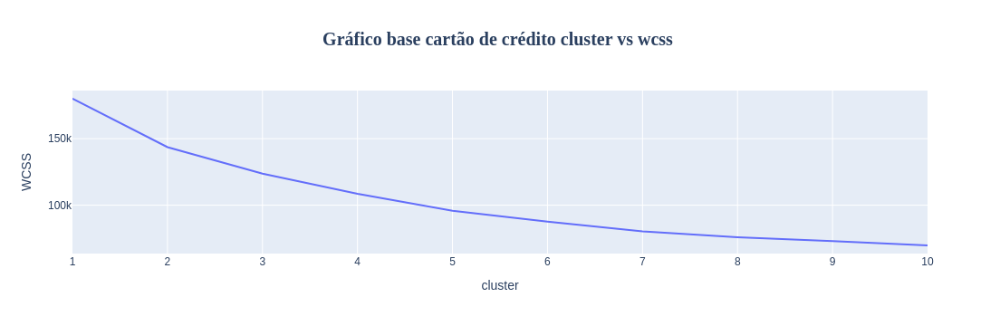

In [15]:
grafico = px.line(x = range(1,11), y = wcss, title='<b>Gráfico base cartão de crédito cluster vs wcss </b>')

# Atualiza o layout para renomear os rótulos dos eixos X e Y
grafico.update_layout(
    xaxis_title_text='cluster',
    yaxis_title_text='WCSS',
    # padrão o título
    title_font_size=20,  # Define o tamanho da fonte do título
    title_font_family='Arial Black', # Uma fonte mais grossa
    title_x=0.5 # Centraliza o título no gráfico
)

grafico.show()
grafico.write_html("figuras/18-7_grafico.html")
#https://plotly.com/python/interactive-html-export/

In [16]:
# queda do wcss de cluster para cluster, quanto maior melhor,
#porém quanto menor a variação, é o ideal pegar o primeiro menor, antes de tender ao infinito


In [17]:
# ideal fazer o teste com o cluster número 4


In [18]:
kmeans_cartao_mais = KMeans(n_clusters=4, random_state=0)
rotulos = kmeans_cartao_mais.fit_predict(X_cartao_mais)

In [19]:
rotulos

array([0, 1, 1, ..., 3, 0, 0], dtype=int32)

In [20]:
set(rotulos)

{0, 1, 2, 3}

In [21]:
# o gráfico é mais complexto, pois agora temos mais atributos, de 6 atributos (colunas) para ser exato.

Principal Component Analysis (PCA) is a dimension reduction method that is frequently used in exploratory data analysis and machine learning. This means that PCA can be leveraged to reduce the number of variables (dimensions) in a dataset without losing too much information.

https://www.codecademy.com/article/principal-component-analysis-intro

Redução da dimensionalidade => PCA (Principal Component Analysis)

### PCA (Principal Component Analysis)

6 atributos, queremos combinar esses atributos, e será feito vários cálculos matemáticos para encontrar aqueles que são mais similares e vamos gerar somente dois atributos como resultados. 

Implementação nova. 

In [22]:
from sklearn.decomposition import PCA

In [23]:
pca = PCA(n_components=2) # de 6 colunas ou atributos, agora queremos ter 2 colunas ou atributos. 
X_cartao_mais_pca = pca.fit_transform(X_cartao_mais)

In [24]:
X_cartao_mais_pca # teremos apenas 2 atributos apenas.

array([[-0.74082054, -1.13671858],
       [-1.48027121, -0.30100547],
       [-0.94737386, -0.48666789],
       ...,
       [-0.79468657, -0.90012663],
       [ 1.17562376, -1.54746987],
       [ 1.13614987, -1.14039836]])

In [25]:
pca.get_params()

{'copy': True,
 'iterated_power': 'auto',
 'n_components': 2,
 'n_oversamples': 10,
 'power_iteration_normalizer': 'auto',
 'random_state': None,
 'svd_solver': 'auto',
 'tol': 0.0,
 'whiten': False}

In [26]:
X_cartao_mais_pca.shape

(30000, 2)

In [27]:
X_cartao_mais_pca

array([[-0.74082054, -1.13671858],
       [-1.48027121, -0.30100547],
       [-0.94737386, -0.48666789],
       ...,
       [-0.79468657, -0.90012663],
       [ 1.17562376, -1.54746987],
       [ 1.13614987, -1.14039836]])

In [28]:
# a partir desses dados fazemos a geração dos dados

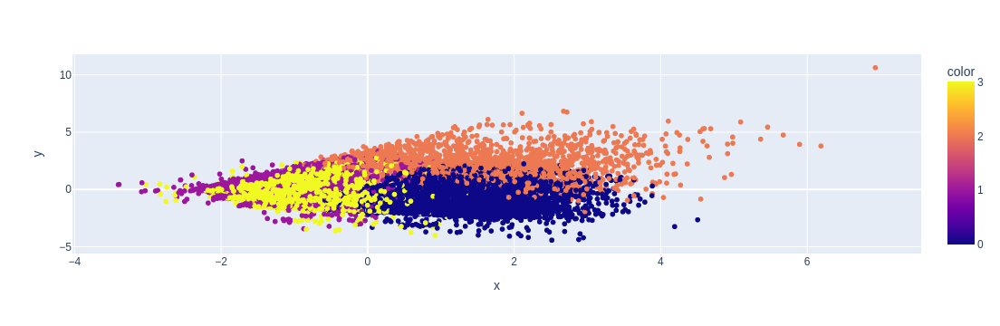

In [29]:
grafico = px.scatter(x= X_cartao_mais_pca[:,0], y = X_cartao_mais_pca[:,1], color=rotulos)
grafico.show()

In [30]:
# agrupamento definido

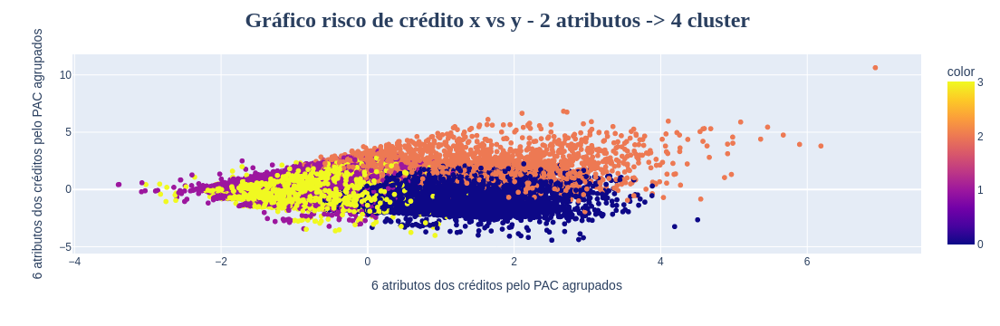

In [31]:
# x base idade e base salário
grafico = px.scatter(x= X_cartao_mais_pca[:,0], y = X_cartao_mais_pca[:,1], color=rotulos)

# Atualiza o layout para renomear os rótulos dos eixos X e Y
grafico.update_layout(
    # Defina o título aqui, no gráfico que será exibido
    title_text='<b>Gráfico risco de crédito x vs y - 2 atributos -> 4 cluster </b>',
    xaxis_title_text='6 atributos dos créditos pelo PAC agrupados',  
    yaxis_title_text='6 atributos dos créditos pelo PAC agrupados',
    # padrão o título
    title_font_size=24,  # Define o tamanho da fonte do título
    title_font_family='Arial Black', # Uma fonte mais grossa
    title_x=0.5 # Centraliza o título no gráfico
)
grafico.show()
grafico.write_html("figuras/18-7_grafico2.html")

In [32]:
# diferente o agrupmento, pois é feito uma combinação dos atributos

[[-0.74082054 -1.13671858]
 [-1.48027121 -0.30100547]
 [-0.94737386 -0.48666789]
 ...
 [-0.79468657 -0.90012663]
 [ 1.17562376 -1.54746987]
 [ 1.13614987 -1.14039836]]
{'copy': True, 'iterated_power': 'auto', 'n_components': 2, 'n_oversamples': 10, 'power_iteration_normalizer': 'auto', 'random_state': None, 'svd_solver': 'auto', 'tol': 0.0, 'whiten': False}
(30000, 2)
[[-0.74082054 -1.13671858]
 [-1.48027121 -0.30100547]
 [-0.94737386 -0.48666789]
 ...
 [-0.79468657 -0.90012663]
 [ 1.17562376 -1.54746987]
 [ 1.13614987 -1.14039836]]


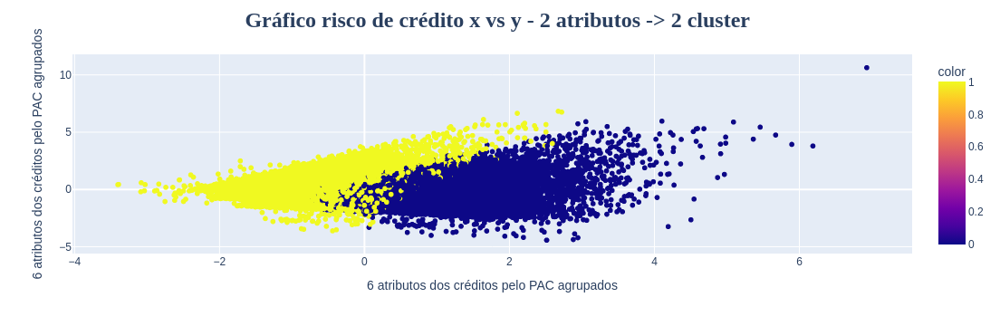

In [33]:
# mudar para 2 clusters

kmeans_cartao_mais = KMeans(n_clusters=2, random_state=0)
rotulos = kmeans_cartao_mais.fit_predict(X_cartao_mais)

pca = PCA(n_components=2) # de 6 colunas ou atributos, agora queremos ter 2 colunas ou atributos. 
X_cartao_mais_pca = pca.fit_transform(X_cartao_mais)
print(X_cartao_mais_pca) # teremos apenas 2 atributos apenas.
print(pca.get_params())
print(X_cartao_mais_pca.shape)
print(X_cartao_mais_pca)
# a partir desses dados fazemos a geração dos dados

# x base idade e base salário
grafico = px.scatter(x= X_cartao_mais_pca[:,0], y = X_cartao_mais_pca[:,1], color=rotulos)

# Atualiza o layout para renomear os rótulos dos eixos X e Y
grafico.update_layout(
    # Defina o título aqui, no gráfico que será exibido
    title_text='<b>Gráfico risco de crédito x vs y - 2 atributos -> 2 cluster </b>',
    xaxis_title_text='6 atributos dos créditos pelo PAC agrupados',  
    yaxis_title_text='6 atributos dos créditos pelo PAC agrupados',
    # padrão o título
    title_font_size=24,  # Define o tamanho da fonte do título
    title_font_family='Arial Black', # Uma fonte mais grossa
    title_x=0.5 # Centraliza o título no gráfico
)
grafico.show()
grafico.write_html("figuras/18-7_grafico3.html")


In [36]:
# são novos atributos em conjunto no eixo x e y.

# interessante para a visualização dos resultados

In [39]:
lista_clientes = np.column_stack((base_cartao, rotulos))
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()]
lista_clientes # organizar para combinar os atributos e os resultados, para verificar quais clientes pertencem a cada grupo.

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [ 16675, 100000,      1, ...,      0,  92399,      0],
       [ 16672, 440000,      1, ...,      0,  87193,      0],
       ...,
       [  6251,  10000,      2, ...,      0,  59367,      1],
       [  6246, 260000,      2, ...,      0, 796048,      1],
       [ 15000,  50000,      1, ...,      0, 249711,      1]])